## Overview:

This project builds a model to predict how much someone will pay for a house in King County Seatle, Washington. Inital exploratory data analysis shows that [something]. Based on that discovery, the model used [these initial features] to determine house prices based on unseen data. After [number] iterations, the final model has an R-Squared of [number] and RMSE of [number]. The final model's predictions on the holdout set can be found in [housing_preds_sidney_kung.csv]

## Business Questions:
I will be investigating three main questions through exploratory data anaylsis

1. Can feature selection improve each iteration of the model?
2. Is the final model overfit or underfit?
3. Can the final model produce predictions on the holdout set?

or data related questions:

1. Can we accurately predict the price of houses?
2. On average, what is the most profitable month to sell a house?
3. Do houses with basements sell more on average?
4. Is the relationship between price and interior sqft linear?
    - Do houses sell for more money when they have more interor sqft space?


In [551]:
# importing the neceessary packages
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy as sp
from scipy.stats import pearsonr, f_oneway
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics, linear_model
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression

## Reading in `kc_house_data_train.csv`

In [552]:
# loading in the csv and setting the dataframe to the variable name 'housing'
housing = pd.read_csv('kc_house_data_train.csv')
# checking the unedited training set
housing.head()

,Unnamed: 0,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,2591820310,20141006T000000,365000.0,4,2.25,2070,8893,2.0,0,0,4,8,2070,0,1986,0,98058,47.4388,-122.162,2390,7700
1,1,7974200820,20140821T000000,865000.0,5,3.00,2900,6730,1.0,0,0,5,8,1830,1070,1977,0,98115,47.6784,-122.285,2370,6283
2,2,7701450110,20140815T000000,1038000.0,4,2.50,3770,10893,2.0,0,2,3,11,3770,0,1997,0,98006,47.5646,-122.129,3710,9685
3,3,9522300010,20150331T000000,1490000.0,3,3.50,4560,14608,2.0,0,2,3,12,4560,0,1990,0,98034,47.6995,-122.228,4050,14226
4,4,9510861140,20140714T000000,711000.0,3,2.50,2550,5376,2.0,0,0,3,9,2550,0,2004,0,98052,47.6647,-122.083,2250,4050


In [553]:
housing.shape

(17290, 22)

## Data Cleaning & EDA

In this section, I will be iterively cleaning data (dealing with extreme values) and creating visualizations to become more familiar with the data. 

Our dataset from `kc_house_data_train.csv` does not have any null values, so we are safe to proceed onto iteravely cleaning data with exploratory data analysis (EDA).
    
- This was confirmed by running `housing.isna().sum()`

In [554]:
# checking to see if there are null values

# housing.isna().sum()

In [555]:
# removing this column because it's just indexing the houses
# using inplace = True because i want to permanently delete the column

housing.drop('Unnamed: 0', axis=1, inplace=True)

In [556]:
# some values in the 'bedrooms' & 'bathrooms' columns are listed as 0, I'm going to repalce them with the column's median.
# it's illegal to have 0 bedrooms or bathrooms in a house, so it's safe to assume that the 0's are mistakes (mising data, but non NaN) 

housing['bedrooms'].replace(0, housing.bedrooms.median(), inplace = True)
housing['bathrooms'].replace(0, housing.bathrooms.median(), inplace = True)

# there is also a house with 33 bedrooms, which was confirmed to be false.
# so if any entry has over 20 bedroms, then replace it with the median.

housing.loc[housing.bedrooms > 20, 'bedrooms'] = housing.bedrooms.median()


### Checking distribution of all variables:
The distribution of indpendent variables in regression models could be a factor in the final model's accuracy. Although a feature's normal distrbution isn't a required assumption, it certainly helps when they are normally distributed. This could help produce more meaningful assumptions.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faa0871d860>,
      dtype=object)

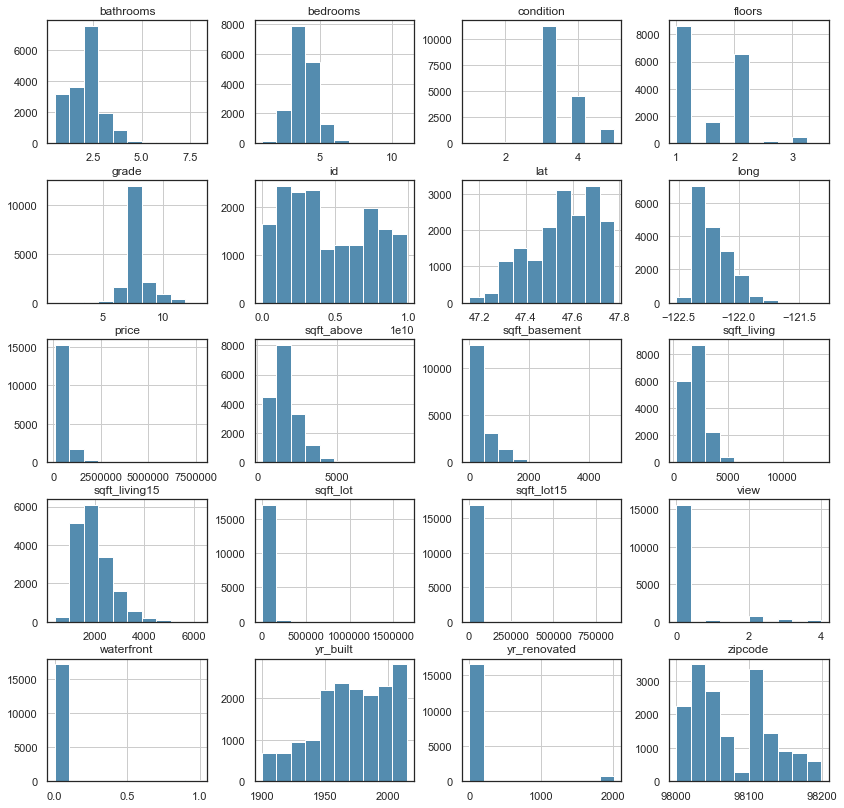

In [557]:
# looking at the distributions
housing.hist(figsize=(14, 14), color='#548CAF')

## ^ explain the signifigance of each of these distributions, and why they matter for the model

- from this visualization, we can see that...
- some are normally distributed with slight skews
- we can also identify the categorical variables

### Assumption of Linearity:
A key assumption of lienar regression is that the relationship between X and Y is ***linear***. Let's check the relationship between `sqft_living` and `price`, to see if that feature should be included in the model. I'll visualize this with a pairplot, because it provides the distribution for each variable, as well.

Text(25.125, 0.5, 'Price')

<Figure size 1008x1440 with 0 Axes>

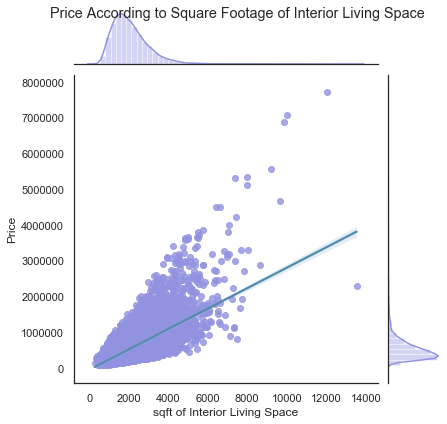

In [558]:
sns.set(style="white", color_codes=True)

sqft = plt.figure(figsize=(14,20))
sqft = sns.jointplot(data = housing, x='sqft_living', y='price', kind='reg', color='#9293E0', joint_kws={'line_kws':{'color':'#548CAF'}})

sqft.fig.suptitle('Price According to Square Footage of Interior Living Space')
plt.xlabel('sqft of Interior Living Space')
plt.ylabel('Price')

- what does the regression line tell us?
- what do the distribtuions on the side tell us?

Additionally, it looks like the varibles 'sqft_living' and 'price' have a highly positive correlation.

Let's confirm this by running a statstical test. We can use Pearson's Correlation Coefficient because these are two continuous variables.


In [559]:
corr = pearsonr(housing.sqft_living, housing.price)
corr

(0.7035403039789669, 0.0)

- The correlation between `sqft_lviing` and `price` is slightly above 0.7. 
- A correlation coefficient above 0.7 is considered strong, meaning that it's safe to use that feature in our model because it's stastically signifigant.

### Don't need to include these bedroom & bathroom visualizations

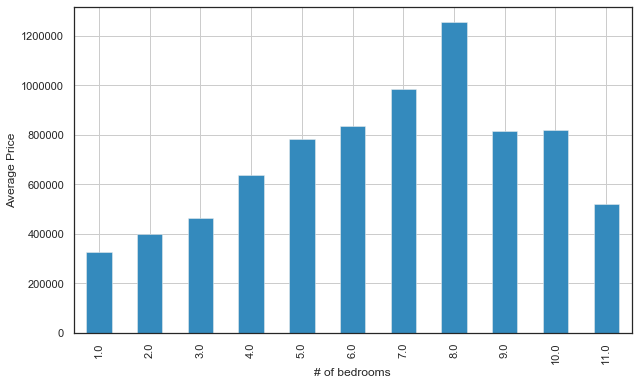

In [560]:
# looking at distribution of # of bedrooms  in relation to price

fig, ax = plt.subplots(figsize=(10,6))

plt.style.use('bmh')
# housing.groupby('bedrooms')['price'].mean().plot(kind='bar')
housing.groupby('bedrooms')['price'].mean().plot(kind='bar')

ax.set_xlabel('# of bedrooms')
ax.set_ylabel('Average Price')

plt.show()

# got rid of 0 bedroom value by replacing it with the median (3.0)

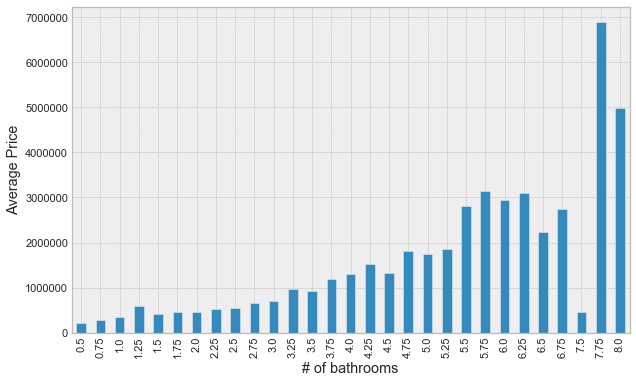

In [561]:
# looking at distribution of # of bathrooms in relation to price

fig, ax = plt.subplots(figsize=(10,6))

plt.style.use('bmh')
housing.groupby('bathrooms')['price'].mean().plot(kind='bar')

ax.set_xlabel('# of bathrooms')
ax.set_ylabel('Average Price')

plt.show()

# got rid of 0 bathroom value by replacing it with the median (2.25)

### Correlation Matrix: Let's not include this one - Let's use the correlation matrix for the first model iteration

In [562]:
# fig, ax = plt.subplots(figsize = (15, 13))
# colormap= sns.diverging_palette(220, 10, as_cmap = True)
# sns.heatmap(housing.corr(), annot=True, cmap = colormap, annot_kws={'size':10})

## Feature Engineering

Based on the data that we were given in `kc_house_data_train.csv`, I will be generating new features that could be helpful for the final model's predictions. With each new feature, I'll perform brief EDA to visualize that new feature.

### New Feature #1: Pulling the month from the 'date' column
Currently, the 'date' column is a string with the year, month and date joined together. I'm going to pull out the month to see if there is any relationship between price and the months that each house is sold.

This new feature is more for eda/visualization purposes, I'm mostly interested in seeing if there are any specific months where homes sell for higher.

In [563]:
# cleaning the dates column, so that it's only the date numbers
housing["date"] = housing["date"].str.replace('T000000', '')

# make new column called month_sold with only the months
housing['month_sold'] = housing['date'].str[4:6]

# removing 0s only if they are at the begnining of single digit months
housing['month_sold'] = housing['month_sold'].str.replace('01', '1').replace('02', '2').replace('03', '3').replace('04', '4').replace('05', '5').replace('06', '6').replace('07', '7').replace('08', '8').replace('09', '9')

# converting new column 'month_sold' to int so we can graph it
housing['month_sold'] = housing['month_sold'].astype(int)

In [564]:
housing.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold
0,2591820310,20141006,365000.0,4.0,2.25,2070,8893,2.0,0,0,4,8,2070,0,1986,0,98058,47.4388,-122.162,2390,7700,10
1,7974200820,20140821,865000.0,5.0,3.00,2900,6730,1.0,0,0,5,8,1830,1070,1977,0,98115,47.6784,-122.285,2370,6283,8
2,7701450110,20140815,1038000.0,4.0,2.50,3770,10893,2.0,0,2,3,11,3770,0,1997,0,98006,47.5646,-122.129,3710,9685,8
3,9522300010,20150331,1490000.0,3.0,3.50,4560,14608,2.0,0,2,3,12,4560,0,1990,0,98034,47.6995,-122.228,4050,14226,3
4,9510861140,20140714,711000.0,3.0,2.50,2550,5376,2.0,0,0,3,9,2550,0,2004,0,98052,47.6647,-122.083,2250,4050,7


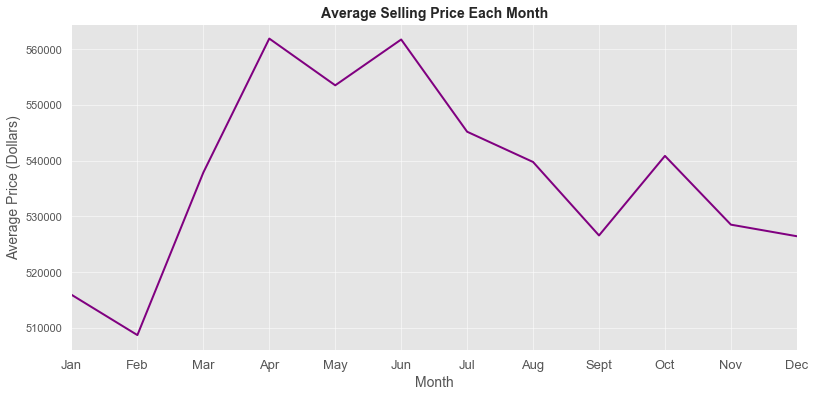

In [565]:
# creating a graph of average price per month to visualize if there's a trend

housing.sort_values(by='month_sold', ascending=True)
months = sorted(housing['month_sold'].unique())

avg_price = housing.groupby('month_sold')['price'].mean()

plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(13,6))
ax.plot(months, avg_price, color='purple')

# setting title and axis labels
ax.set_xlabel('Month', fontsize=14)
ax.set_ylabel('Average Price (Dollars)', fontsize=14)
ax.set_title('Average Selling Price Each Month', fontsize=14, weight='bold')

# setting month labels
ax.set_xlim(1, 12)
ax.set_xticks((1,2,3,4,5,6,7,8,9,10,11,12))
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec'], fontsize=13)

plt.show()

# this graph shows the average price for each month for visualization purposes
# but if i use this feature in the model, we wouldn't find the average each month. just keep it as is to account for each individual house

In [566]:
# # create a regression plot to see if there's any relationship between price and month for each house

# fig = plt.figure(figsize=(7,5))
# plt.scatter(housing.month_sold, housing.price, color='blue')

# # suprise! it's a categorical variable so there isn't really a relationship :(

### Running an ANOVA test on `price` and `month_sold`

The purpose of an ANOVA test is to test how various independent factors may influence the overall result. In this sitiation, we would want to test how each month influences the prices that houses are typically sold at.

The general idea is to break the sum of squared deviations into multiple parts: the sum of squared deviations of the mean of each of the test groups to the observations within the group itself, and the sum of squared deviations of the mean of these test groups to the mean of all observations. 

Luckily, we can easily do this with `scipy`!

- **Null Hypothesis:** There is no difference in means for each month's sample
- **Alternative Hypothesis:** The means are not equal for each month's sample
- **Signifigance Level (alpha):** 0.05

In [567]:
# creating a sample measurement for each month, using the month value as the first argument, and price as the continuous variable
jan = housing.loc[housing['month_sold'] == 1, 'price']
feb = housing.loc[housing['month_sold'] == 2, 'price']
mar = housing.loc[housing['month_sold'] == 3, 'price']
apr = housing.loc[housing['month_sold'] == 4, 'price']
may = housing.loc[housing['month_sold'] == 5, 'price']
jun = housing.loc[housing['month_sold'] == 6, 'price']
jul = housing.loc[housing['month_sold'] == 7, 'price']
aug = housing.loc[housing['month_sold'] == 8, 'price']
sep = housing.loc[housing['month_sold'] == 9, 'price']
otb = housing.loc[housing['month_sold'] == 10, 'price']
nov = housing.loc[housing['month_sold'] == 11, 'price']
dec = housing.loc[housing['month_sold'] == 12, 'price']

# using scipy function f_oneway to conduct an ANOVA test for the f-statistic
sp.stats.f_oneway(jan,feb,mar,apr,may,jun,jul,aug,sep,otb,nov,dec)

F_onewayResult(statistic=2.7046975005044085, pvalue=0.0017444151469153434)

According to the output:
- f-statstic: 2.7051826530074017
- p-value: 0.0017410682855530015

The f-statistic represents the variation between each sample, which are the months in this case. Variances measure the dispersal of the data points around the mean. The higher the f-value, the farther that indivudal data points tend to fall from the mean.

Because the p-value is way below 0.5, we can safely reject the null hypothesis.

Therefore, in this situation, the f-value describes that the variance between the mean price for each month is pretty high. And we can safely use the p-value to reject the null hypothesis, and say that each month sees different selling prices for each house.

In terms of building the model, this information is valuable because it proves that the month greatly impacts how much a house could sell for.

### New Feature #2: Total sqft of the property

In the given data set, the entire property size is split up between 'sqft_living' and 'sqft_lot' so I want to add those together so see if there's any signifigance.

**(Insert explanation for this decision)**

In [568]:
housing['full_sqft'] = housing['sqft_living'] + housing['sqft_lot']

In [569]:
# creating new column with full proprty size
housing['full_sqft'] = housing['sqft_living'] + housing['sqft_lot']

# when i graphed this new 'full_sqft' column, there was an outlier. 
# So i decided to repalce with the median.
# I tried playing around with proportions to the 75th percentile, but there was way too much data outside of that scope
# So eventhough it may impact reproducability, I'm gonna manually set the threshold here.

housing.loc[housing.full_sqft > 1400000] = housing.full_sqft.median()

# (housing.full_sqft.quantile(q=0.75) * 5)
# (housing.full_sqft.mean() + (housing.full_sqft.std() * 3))

In [570]:
housing.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,full_sqft
0,2.591820e+09,20141006,365000.0,4.0,2.25,2070.0,8893.0,2.0,0.0,0.0,4.0,8.0,2070.0,0.0,1986.0,0.0,98058.0,47.4388,-122.162,2390.0,7700.0,10.0,10963.0
1,7.974201e+09,20140821,865000.0,5.0,3.00,2900.0,6730.0,1.0,0.0,0.0,5.0,8.0,1830.0,1070.0,1977.0,0.0,98115.0,47.6784,-122.285,2370.0,6283.0,8.0,9630.0
2,7.701450e+09,20140815,1038000.0,4.0,2.50,3770.0,10893.0,2.0,0.0,2.0,3.0,11.0,3770.0,0.0,1997.0,0.0,98006.0,47.5646,-122.129,3710.0,9685.0,8.0,14663.0
3,9.522300e+09,20150331,1490000.0,3.0,3.50,4560.0,14608.0,2.0,0.0,2.0,3.0,12.0,4560.0,0.0,1990.0,0.0,98034.0,47.6995,-122.228,4050.0,14226.0,3.0,19168.0
4,9.510861e+09,20140714,711000.0,3.0,2.50,2550.0,5376.0,2.0,0.0,0.0,3.0,9.0,2550.0,0.0,2004.0,0.0,98052.0,47.6647,-122.083,2250.0,4050.0,7.0,7926.0


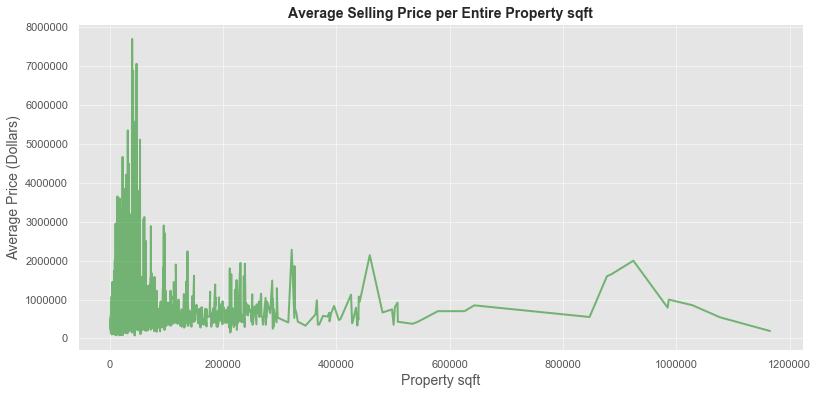

In [571]:
# creating a graph of average price per month to visualize if there's a trend

housing.sort_values(by='full_sqft', ascending=True)
size = sorted(housing['full_sqft'].unique())

avg_price = housing.groupby('full_sqft')['price'].mean()

plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(13,6))
ax.plot(size, avg_price, color='green', alpha=0.5)

# setting title and axis labels
ax.set_xlabel('Property sqft', fontsize=14)
ax.set_ylabel('Average Price (Dollars)', fontsize=14)
ax.set_title('Average Selling Price per Entire Property sqft', fontsize=14, weight='bold')

plt.show()

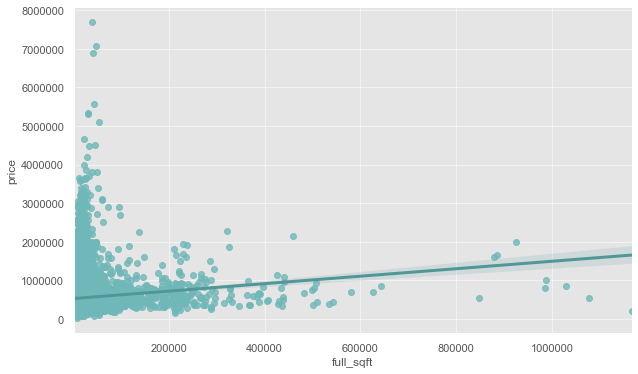

In [572]:
fig, ax = plt.subplots(figsize=(10,6))
plt.style.use('bmh')
sns.regplot(data=housing, x='full_sqft', y='price', scatter_kws={"color": '#6FB7B8'}, line_kws={"color": '#529798'})

# it looks like there's an outlier here... should we change it to the median?

Text(25.125, 0.5, 'Price (Dollars)')

<Figure size 1008x1440 with 0 Axes>

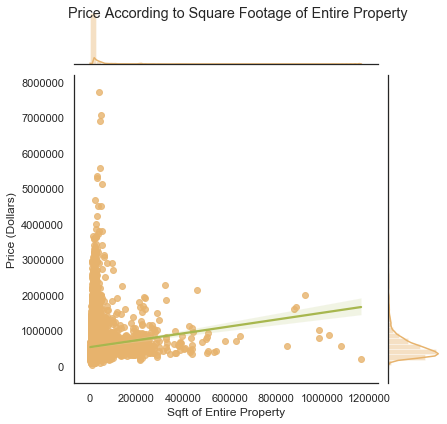

In [573]:
# there is a crazy outlier but i think i'll just leave it in?
# theyre not too far away to be worried about

sns.set(style="white", color_codes=True)

sqft = plt.figure(figsize=(14,20))
sqft = sns.jointplot(data = housing, x='full_sqft', y='price', kind='reg', color = '#E7B36D', joint_kws={'line_kws':{'color':'#A7B74E'}})

sqft.fig.suptitle('Price According to Square Footage of Entire Property')
plt.xlabel('Sqft of Entire Property')
plt.ylabel('Price (Dollars)')

At first glance, the pairplot shows that `full_sqft` has a lower positive relationship with `price`. Let's run another stastical test to confirm this, using Pearson's correlation coefficient. 

In [574]:
new_corr = pearsonr(housing.full_sqft, housing.price)
new_corr

(0.10539128165228828, 6.720439611616017e-44)

We can see that the correlation coefficient for these variables is about 0.10541. Typically, a value below 0.3 would be considered to be weak. In this situation, it looks like it's even closer to having no correlation.

Note: according to documentation, 6.48e-44 would be the p-value

Even though the linear relationship between 'full_sqft' and 'price' is weak, I'm still going to include the feature in my intial model, just to test out how it performs. But I ultimately remove it during the later feature selection process.

### New Feature #3: Age of the property

Right now, the only information we have about each house's age is the year it was built, aka `yr_built`. I want to convert those values to see how many years old each house is, and if there's a signifigant relationship there.

In [575]:
housing['age'] = 2020 - housing['yr_built']

# after i ran this as a graph, there was a crazy outlier so i'll just replace that with the median
housing.loc[housing.age < 0] = housing.age.median()


In [576]:
housing.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,full_sqft,age
count,1.729000e+04,1.729000e+04,17290.000000,17290.000000,17290.000000,1.729000e+04,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,1.729000e+04,17290.000000
mean,4.565443e+09,5.406991e+05,3.375246,2.115587,2081.392076,1.514789e+04,1.492915,0.010642,0.241006,3.410931,7.656738,1789.233488,292.161249,1970.683632,83.808965,98072.526547,47.559987,-122.204541,1987.841296,12848.864199,6.573048,1.722928e+04,49.204858
std,2.874739e+09,3.733397e+05,0.963784,0.838393,920.129569,4.043333e+04,0.636389,0.360914,0.849504,0.727382,1.210309,829.362736,443.150258,32.789769,400.328972,747.465221,0.138897,1.287010,684.948053,27046.080760,3.131271,4.060588e+04,29.340983
min,4.600000e+01,4.600000e+01,1.000000,0.500000,46.000000,4.600000e+01,1.000000,0.000000,0.000000,1.000000,1.000000,46.000000,0.000000,46.000000,0.000000,46.000000,46.000000,-122.519000,46.000000,46.000000,1.000000,4.600000e+01,5.000000
25%,2.114701e+09,3.209250e+05,3.000000,1.500000,1430.000000,5.080250e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1951.000000,0.000000,98033.000000,47.471200,-122.329000,1490.000000,5111.000000,4.000000,7.070000e+03,24.000000
50%,3.903650e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.642000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1974.000000,0.000000,98065.000000,47.571600,-122.230000,1840.000000,7622.000000,6.000000,9.610000e+03,46.000000
75%,7.301150e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.072500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2214.500000,560.000000,1996.000000,0.000000,98118.000000,47.677900,-122.126000,2360.000000,10101.000000,9.000000,1.302800e+04,69.000000
max,9.900000e+09,7.700000e+06,46.000000,46.000000,13540.000000,1.164794e+06,46.000000,46.000000,46.000000,46.000000,46.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,46.000000,6210.000000,858132.000000,46.000000,1.165504e+06,120.000000


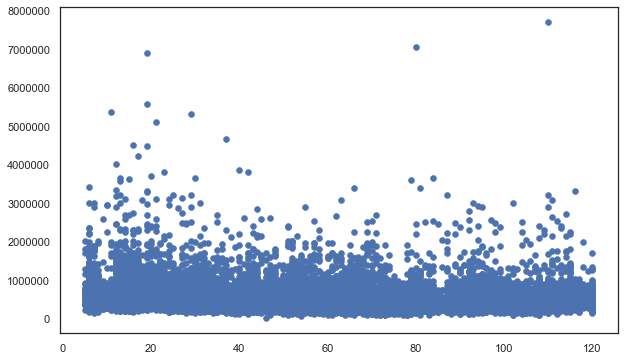

In [577]:
# checking to see if there's a linear relationship

fig, ax = plt.subplots(figsize=(10,6))
plt.style.use('bmh')
plt.scatter(data=housing, x='age', y='price')

### New Feature #4: Does the home have a basement?

In [578]:
housing['basement'] = housing['sqft_basement'].apply(lambda x:  1 if x > 0 else 0)

(array([10483.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,  6807.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

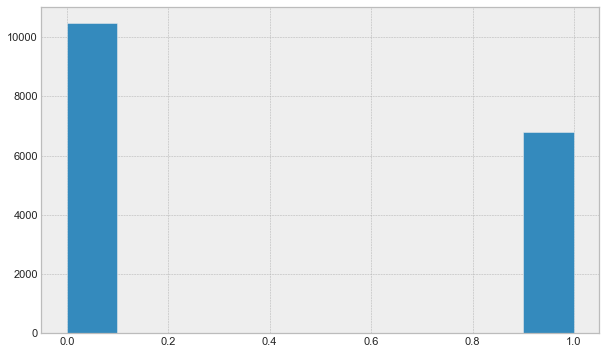

In [579]:
fig, ax = plt.subplots(figsize=(10,6))
plt.style.use('bmh')
plt.hist(data=housing, x='basement')

### New Feature #5: Has the house been renovated?

In [580]:
housing['renovated'] = housing['yr_renovated'].apply(lambda x:  1 if x > 0 else 0)

(array([16563.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,   727.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

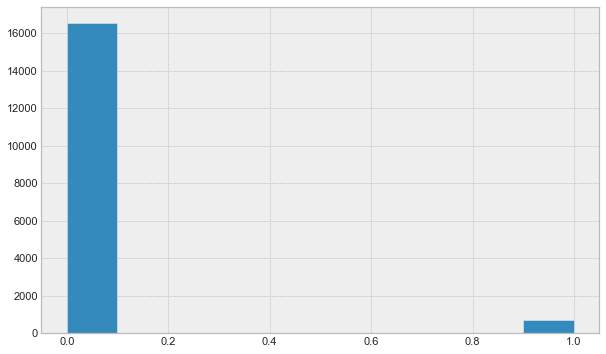

In [581]:
fig, ax = plt.subplots(figsize=(10,6))
plt.style.use('bmh')
plt.hist(data=housing, x='renovated')

### New Feature #6: Creating an interaction between `full_sqft` and `waterfront`

Interaction features can be created between binary (dummy) varibales and a continuous variable. This could help display whether houses by the waterfront determine the average property size.

Create an interaction feature between a binary variable (dummy variable) and a continuous variable.

**(Insert explanation for this decision)**

In [582]:
# creating new column 'sqft_waterfront' by multiplying 'full_sqft' and 'waterfront' to see whether those features have a relationship.
# in other words, are houses by the waterfront bigger on average?

housing['sqft_waterfront'] = housing['full_sqft'] * housing['waterfront']

# create the column and then graph to see how it's changed

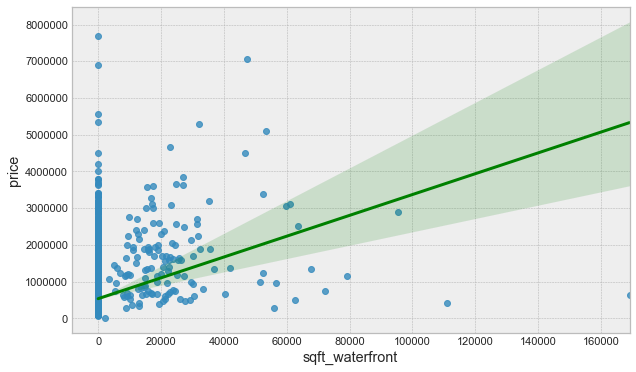

In [583]:
# checking the linear relationship with a regression plot
fig, ax = plt.subplots(figsize=(10,6))
plt.style.use('bmh')
sns.regplot(data=housing, x='sqft_waterfront', y='price', line_kws={"color": "green"})

### New Feature #7: Turning `months_sold` into dummy variables

In [584]:
# changing every numerical value to the month name
housing['month_sold'] = housing['month_sold'].replace(1.0, 'january').replace(2.0, 'february').replace(3.0, 'march').replace(4.0, 'april').replace(5.0, 'may').replace(6.0, 'june').replace(7.0, 'july').replace(8.0, 'august').replace(9.0, 'september').replace(10.0, 'october').replace(11.0, 'november').replace(12.0, 'december')

dummy_months = pd.get_dummies(housing['month_sold'])

# 'january','february','march','april','may','june','july','august','september','october','november','december'

In [585]:
housing.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,full_sqft,age,basement,renovated,sqft_waterfront
0,2.591820e+09,20141006,365000.0,4.0,2.25,2070.0,8893.0,2.0,0.0,0.0,4.0,8.0,2070.0,0.0,1986.0,0.0,98058.0,47.4388,-122.162,2390.0,7700.0,october,10963.0,34.0,0,0,0.0
1,7.974201e+09,20140821,865000.0,5.0,3.00,2900.0,6730.0,1.0,0.0,0.0,5.0,8.0,1830.0,1070.0,1977.0,0.0,98115.0,47.6784,-122.285,2370.0,6283.0,august,9630.0,43.0,1,0,0.0
2,7.701450e+09,20140815,1038000.0,4.0,2.50,3770.0,10893.0,2.0,0.0,2.0,3.0,11.0,3770.0,0.0,1997.0,0.0,98006.0,47.5646,-122.129,3710.0,9685.0,august,14663.0,23.0,0,0,0.0
3,9.522300e+09,20150331,1490000.0,3.0,3.50,4560.0,14608.0,2.0,0.0,2.0,3.0,12.0,4560.0,0.0,1990.0,0.0,98034.0,47.6995,-122.228,4050.0,14226.0,march,19168.0,30.0,0,0,0.0
4,9.510861e+09,20140714,711000.0,3.0,2.50,2550.0,5376.0,2.0,0.0,0.0,3.0,9.0,2550.0,0.0,2004.0,0.0,98052.0,47.6647,-122.083,2250.0,4050.0,july,7926.0,16.0,0,0,0.0


In [586]:
dummy_months.head()

,46.0,april,august,december,february,january,july,june,march,may,november,october,september
0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0


In [587]:
housing = housing.join(dummy_months)

In [588]:
housing.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_sold,full_sqft,age,basement,renovated,sqft_waterfront,46.0,april,august,december,february,january,july,june,march,may,november,october,september
0,2.591820e+09,20141006,365000.0,4.0,2.25,2070.0,8893.0,2.0,0.0,0.0,4.0,8.0,2070.0,0.0,1986.0,0.0,98058.0,47.4388,-122.162,2390.0,7700.0,october,10963.0,34.0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,7.974201e+09,20140821,865000.0,5.0,3.00,2900.0,6730.0,1.0,0.0,0.0,5.0,8.0,1830.0,1070.0,1977.0,0.0,98115.0,47.6784,-122.285,2370.0,6283.0,august,9630.0,43.0,1,0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,7.701450e+09,20140815,1038000.0,4.0,2.50,3770.0,10893.0,2.0,0.0,2.0,3.0,11.0,3770.0,0.0,1997.0,0.0,98006.0,47.5646,-122.129,3710.0,9685.0,august,14663.0,23.0,0,0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,9.522300e+09,20150331,1490000.0,3.0,3.50,4560.0,14608.0,2.0,0.0,2.0,3.0,12.0,4560.0,0.0,1990.0,0.0,98034.0,47.6995,-122.228,4050.0,14226.0,march,19168.0,30.0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,9.510861e+09,20140714,711000.0,3.0,2.50,2550.0,5376.0,2.0,0.0,0.0,3.0,9.0,2550.0,0.0,2004.0,0.0,98052.0,47.6647,-122.083,2250.0,4050.0,july,7926.0,16.0,0,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0


## Train-Test Split
Now that we have created six new features, let's begin the modeling process!

- Before we create our model, we need to split the 'housing' data apart. We do this split early on to avoid data-leakage, which would prevent us from being influenced while making decisions about the model.
    - The 'train set' will be used to fit the model to our data.
    - The 'test set' will simulate new and unseen data, which we will disregard until the end of the analysis.
- Another reason we do this is because a model's prediction capability relies on independent test data. Ultimately, this practice gives us a measure of the quality of the ultimately chosen model.
- We can easily perform a test-train split with a built-in function in `sklearn`.

### Performing a train-test split of the data:

In [589]:
train_set, test_set = train_test_split(housing, test_size=0.2, random_state=42)
print(len(train_set), "train +", len(test_set), "test")

13832 train + 3458 test


### Setting variables for x_train, y_train, x_test, and y_test:

In [590]:
# seperating data into x_train and y_train

# here i'm only dropping the 'price' column so i can feed x and y into sklearn
without_price = train_set.drop('price', axis=1)
price_column = train_set['price'].copy()
# doing the same for test_set
test_x_df = test_set.drop('price', axis=1)
test_y_df = test_set['price'].copy()

# setting the train_set dataframe without the price column to x_train, and the price column to y_train
x_train = without_price
y_train = price_column
# doing the same for testing variables
x_test = test_x_df
y_test = test_y_df

## Creating a baseline model
A baseline model is a model without any predictors. This is not a regression model, so we shouldn't use it on any real-life data. A baseline model's purpose is simply to demonstrate the worst possible fit, so that you can compare the real models against it later.

In [591]:
dummy = DummyRegressor()
dummy.fit(x_train, y_train)
dummy.score(x_train, y_train)

# we get an r-squared of 0, because we're predictng using NO features
# dummy models are more useful for looking at the RMSE, so let's check that out

0.0

In [592]:
y_pred = dummy.predict(x_train)
y_pred

array([542584.52190573, 542584.52190573, 542584.52190573, ...,
       542584.52190573, 542584.52190573, 542584.52190573])

In [593]:
dummy_rmse = mean_squared_error(y_train, y_pred, squared=False)
dummy_rmse

# The RSME here can be interpreted as the amount on average a data point differs from the line of best fit
# This value is in units of the y variable so in our case the price of the house will differ from the predicted value on average of 375,414 dollars
# That's really bad, but it makes sense! Because it's a dummy model

375414.5547329206

## Creating Model #1

- First, I will be generating the model with `statsmodels` to be able to easily see values like the R-Squared and feature coefficients.
- After that, I will use `sklearn` to fit the model to the **training data.** From there, we can predict on y and generate an RMSE for how the model performs on the training data.
- From there, we can do a similar transform & predict procedure on the **testing** data and generate another RMSE.
- With the RMSE of how the model performs on the training and testing sets, we can determine whether the model is underfit or overfit.

** explain why you chose the features that you did!! **
- because this is the first iteration, I'm just using any features that I'm interested in
- after it's fit and predicted on, then i'll use feature selection to specifically add/drop features

In [594]:
# generating model with statsmodels
# target: price
# features: bedrooms+bathrooms+sqft_living+floors+waterfront+view+condition+grade+month_sold+full_sqft+age+basement+renovated

first_model = ols(formula='price~bedrooms+bathrooms+sqft_living+floors+waterfront+view+condition+grade+full_sqft+age+basement+renovated+sqft_waterfront+january+february+march+april+may+june+july+august+september+october+november+december', 
                data=train_set).fit()
first_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                     1046.
Date:                Thu, 22 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:19:47   Log-Likelihood:            -1.8982e+05
No. Observations:               13832   AIC:                         3.797e+05
Df Residuals:                   13806   BIC:                         3.799e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -3.488e+07   1.57e+06    -22.186      0.000    -3.8e+07   -3.18e+07
bedrooms        -4.224e+04   2670.174    -15.821      0.000   -4.75e+04    -3.7e+04
bathrooms        4.836e+04   4502.141     10.742      0.000    3.95e+04    5.72e+04
sqft_living       178.7432      4.222     42.332      0.000     170.467     187.020
floors           2.328e+04   4627.780      5.030      0.000    1.42e+04    3.23e+04
waterfront        5.36e+05   3.38e+04     15.861      0.000     4.7e+05    6.02e+05
view             4.414e+04   2790.577     15.819      0.000    3.87e+04    4.96e+04
condition        2.152e+04   3181.802      6.764      0.000    1.53e+04    2.78e+04
grade            1.229e+05   2723.972     45.136      0.000    1.18e+05    1.28e+05
full_sqft          -0.2668      0.048     -5.505      0.000      -0.362      -0.172
age              3597.1159     90.768     39.630      0.000    3419.198    3775.034
basement          486.9203   4409.378      0.110      0.912   -8156.059    9129.900
renovated        1.186e+04   9993.017      1.186      0.235   -7731.717    3.14e+04
sqft_waterfront     1.3644      0.928      1.471      0.141      -0.454       3.183
january          3.384e+07   1.57e+06     21.575      0.000    3.08e+07    3.69e+07
february         3.384e+07   1.57e+06     21.574      0.000    3.08e+07    3.69e+07
march            3.387e+07   1.57e+06     21.592      0.000    3.08e+07    3.69e+07
april            3.388e+07   1.57e+06     21.601      0.000    3.08e+07     3.7e+07
may              3.385e+07   1.57e+06     21.578      0.000    3.08e+07    3.69e+07
june             3.384e+07   1.57e+06     21.574      0.000    3.08e+07    3.69e+07
july             3.384e+07   1.57e+06     21.571      0.000    3.08e+07    3.69e+07
august           3.384e+07   1.57e+06     21.576      0.000    3.08e+07    3.69e+07
september        3.383e+07   1.57e+06     21.570      0.000    3.08e+07    3.69e+07
october          3.385e+07   1.57e+06     21.579      0.000    3.08e+07    3.69e+07
november         3.383e+07   1.57e+06     21.566      0.000    3.08e+07    3.69e+07
december         3.383e+07   1.57e+06     21.569      0.000    3.08e+07    3.69e+07
==============================================================================
Omnibus:                    10845.442   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           896828.465
Skew:                           3.170   Prob(JB):                         0.00
Kurtosis:                      41.934   Cond. No.                     1.32e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.32e+08. This might indicate that 

^^Spend some time Thursday interpreting this before moving on to fitting and predicting this summary table

## Fitting the model to the training data:
With `sklearn`, we can easily fit the model and perform a prediction on 'y' aka the price column.

In [595]:
# setting 'x_train_1' to the features I want to fit in this first model
x_train_1 = x_train[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','grade','full_sqft','age','basement','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']]

# instantiate LinearRegression to use
# coefficients are learnt and stored in 'model_1'
model_1 = LinearRegression()
model_1.fit(x_train_1, y_train)

LinearRegression()

## Now let's use 'x_train_1' to predict the y for this training data:

In [596]:
# predicting on the y (price) for train_set
y_pred = model_1.predict(x_train_1)

## Evaluating the training predictions using RMSE:

In [597]:
# get the RMSE for the train set
model_1_rsme = mean_squared_error(y_train, y_pred, squared=False)
model_1_rsme

220709.11965382707

^ Be sure to interpret every output that we've created here

- What does the coef mean?
- What what does the intercept mean?
- What does the R-Squared (score) mean?
- What does the RMSE mean?

## Using the model to transform & predict on the testing set:
Now let's pretend this first model is ready to predict on the training data. The first thing we need to do is transform our training data in the same way as our test data.

In [598]:
# transforming and .predict on the test_set

x_test_1 = x_test[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','grade','full_sqft','age','basement','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']]

# feeding in the training data because this is a transformation
testing_model_1 = LinearRegression().fit(x_train_1, y_train)

In [599]:
y_pred_test = testing_model_1.predict(x_test_1)

In [600]:
# getting R-Squared for testing_model_1
testing_model_1.score(x_test_1, y_test)

# it got slightly better!
# from training set's r-squared of 0.641530005176258

0.6550052663125845

## Evaluating the testing predictions using RMSE

In [601]:
testing_model_1_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
testing_model_1_rmse

214251.9000331857

In [602]:
print('Training Root Mean Squared Error:' , model_1_rsme)
print('Testing Root Mean Squared Error:' , testing_model_1_rmse)

Training Root Mean Squared Error: 220709.11965382707
Testing Root Mean Squared Error: 214251.9000331857


## Interpreting the RMSE's of the training and testing sets
- When transformed & predicted on the test data, the model's RMSE went down from 224769.568 to 213674.299
- According to the rules, when the RMSE decreases, that means this model may be **underfit**

### VIF: will not be included in final notebook, because the correlation matrix is sufficient

In [603]:
# vif = pd.DataFrame()
# vif["VIF Factor"] = [variance_inflation_factor(x_train_1.values, i) for i in range(x_train_1.shape[1])]
# vif["features"] = x_train_1.columns
# vif.round(1)

In [604]:
# vif = pd.DataFrame()
# vif["VIF Factor"] = [variance_inflation_factor(x_test_1.values, i) for i in range(x_test_1.shape[1])]
# vif["features"] = x_test_1.columns
# vif.round(1)

## Feature Selection

When the first model was used to predict on the y-test data, it produced an RMSE of 213674.299. Although this isn't too high, it's not the best. Considering that the baseline model produced an RMSE of 375414.5547, the first model didnt perform ***that*** much better.

We'll use feature selection to create another iteration of the model, so try to improve the RMSE.

### Checking for Multicollinearity

In [605]:
# creating a numerical correlation matrix
corr_matrix = x_train_1.corr().abs()
corr_matrix

,bedrooms,bathrooms,sqft_living,floors,waterfront,view,condition,grade,full_sqft,age,basement,renovated,sqft_waterfront,january,february,march,april,may,june,july,august,september,october,november,december
bedrooms,1.000000,0.600118,0.546349,0.350351,0.356290,0.232504,0.199532,0.426113,0.036134,0.151538,0.161147,0.025402,0.001153,0.000340,0.005542,0.003285,0.001801,0.006634,0.009085,0.001044,0.009111,0.004006,0.004702,0.009088,0.000279
bathrooms,0.600118,1.000000,0.673096,0.620111,0.436577,0.343531,0.116321,0.691611,0.090188,0.459880,0.151067,0.055769,0.054529,0.000478,0.015552,0.026626,0.002215,0.002601,0.024117,0.012176,0.003005,0.005719,0.005704,0.014805,0.002800
sqft_living,0.546349,0.673096,1.000000,0.280077,0.006673,0.243971,0.055840,0.726904,0.196792,0.316758,0.206606,0.048937,0.102151,0.008518,0.015029,0.026997,0.005452,0.011961,0.021060,0.020445,0.004233,0.001635,0.003858,0.007731,0.002978
floors,0.350351,0.620111,0.280077,1.000000,0.564107,0.273891,0.096018,0.516693,0.008040,0.397806,0.206341,0.027935,0.013258,0.006470,0.005519,0.016432,0.000381,0.016874,0.006794,0.015854,0.004458,0.002741,0.005248,0.004192,0.000432
waterfront,0.356290,0.436577,0.006673,0.564107,1.000000,0.514057,0.475362,0.280922,0.001179,0.003956,0.019962,0.062139,0.175750,0.000101,0.003872,0.002220,0.000452,0.004948,0.003125,0.002518,0.004037,0.003892,0.001155,0.001906,0.001308
view,0.232504,0.343531,0.243971,0.273891,0.514057,1.000000,0.254866,0.334356,0.055708,0.047465,0.172192,0.101798,0.262301,0.000448,0.000014,0.003211,0.000195,0.011384,0.001108,0.006153,0.007964,0.005029,0.004386,0.006790,0.011317
condition,0.199532,0.116321,0.055840,0.096018,0.475362,0.254866,1.000000,0.017978,0.023146,0.310429,0.123040,0.032658,0.006711,0.025504,0.000942,0.019890,0.023720,0.010118,0.021928,0.018676,0.006777,0.005650,0.005327,0.009294,0.005576
grade,0.426113,0.691611,0.726904,0.516693,0.280922,0.334356,0.017978,1.000000,0.129668,0.430012,0.051073,0.013841,0.072357,0.012592,0.014111,0.027605,0.001389,0.011858,0.023989,0.019173,0.003556,0.000440,0.006808,0.013810,0.002547
full_sqft,0.036134,0.090188,0.196792,0.008040,0.001179,0.055708,0.023146,0.129668,1.000000,0.069630,0.043354,0.004815,0.048760,0.017699,0.013439,0.008659,0.012925,0.011645,0.000301,0.001119,0.001706,0.001509,0.005619,0.000481,0.002623
age,0.151538,0.459880,0.316758,0.397806,0.003956,0.047465,0.310429,0.430012,0.069630,1.000000,0.162259,0.225352,0.024910,0.005292,0.004471,0.003934,0.012800,0.018787,0.000087,0.009677,0.015794,0.003528,0.016383,0.005849,0.001870


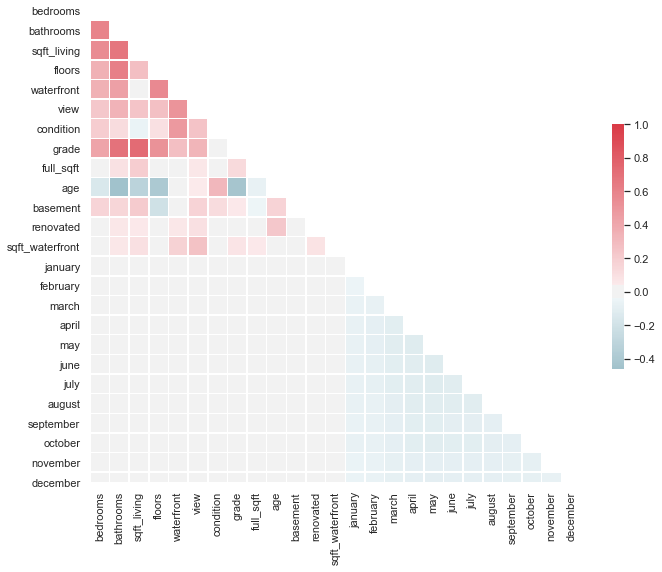

In [606]:
# creating a correlation heatmap, to easily visualize high correlations and refer back to the numerical matrix
sns.set(style="white")
# compute the correlation matrix
corr = x_train_1.corr()
# generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
# set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))
# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

- From the correlation matrix, it looks like the feature with the most correlation issues is `grade`
- That feature has two of the highest correlation coefficients
    - .67 with `sqft_living`
    - .69 with `bathrooms'
- I'll drop `grade` completely for the next model iteration and see if there's any changes

## Correlation Matrix

**(Insert explanation for this decision)**
- what is the purpose of correlation matrixes?
    - to detect multiolinearity between features
    - omg should i do that?
- why i chose this visualzation over this one
    - what is the advantage of this heatmap?
- explain the scale of correlation 
    - the closer the 1, the more strongly correlated the variables are
- this can be used to see if there are any features that have a linear relationship with 'price'
- this can be used later on after i create my first model, to possibly remove any featuers that are correlated with eachother
- i'm only including the given columns for EDA purposes, so i'm not including any new columns that i create through feature engineering
    - this is just for me to use for a rough intial analysis

## Creating Model #2

In [607]:
## fitting the model to the training data:
# setting 'x_train_2' to the features I want to fit in this first model
x_train_2 = x_train[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','full_sqft','age','basement','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']]

# instantiate LinearRegression to use
# coefficients are learnt and stored in 'model_2'
model_2 = LinearRegression()
model_2.fit(x_train_2, y_train)

## predicting on the y (price) for train_set
y_pred = model_2.predict(x_train_2)

# get the RMSE for the train set
model_2_rsme = mean_squared_error(y_train, y_pred, squared=False)
model_2_rsme

236433.3380236692

In [608]:
## transforming and .predict on the test_set
x_test_2 = x_test[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','full_sqft','age','basement','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']]

testing_model_2 = LinearRegression().fit(x_train_2, y_train)

## predicting on the y (price) for test_set
y_pred_test = testing_model_2.predict(x_test_2)

# get the RMSE for the train set
testing_model_2_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
testing_model_2_rmse

230855.4621840552

So the RMSE got slightly higher... let's do more feature selection to try to improve the model.
    - Let's drop features with high p-values above .5

In [609]:
second_model = ols(formula='price~bedrooms+bathrooms+sqft_living+floors+waterfront+view+condition+grade+full_sqft+age+basement+renovated+sqft_waterfront+january+february+march+april+may+june+july+august+september+october+november+december', data=train_set).fit()
second_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.654
Method:                 Least Squares   F-statistic:                     1046.
Date:                Thu, 22 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:19:49   Log-Likelihood:            -1.8982e+05
No. Observations:               13832   AIC:                         3.797e+05
Df Residuals:                   13806   BIC:                         3.799e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -3.488e+07   1.57e+06    -22.186      0.000    -3.8e+07   -3.18e+07
bedrooms        -4.224e+04   2670.174    -15.821      0.000   -4.75e+04    -3.7e+04
bathrooms        4.836e+04   4502.141     10.742      0.000    3.95e+04    5.72e+04
sqft_living       178.7432      4.222     42.332      0.000     170.467     187.020
floors           2.328e+04   4627.780      5.030      0.000    1.42e+04    3.23e+04
waterfront        5.36e+05   3.38e+04     15.861      0.000     4.7e+05    6.02e+05
view             4.414e+04   2790.577     15.819      0.000    3.87e+04    4.96e+04
condition        2.152e+04   3181.802      6.764      0.000    1.53e+04    2.78e+04
grade            1.229e+05   2723.972     45.136      0.000    1.18e+05    1.28e+05
full_sqft          -0.2668      0.048     -5.505      0.000      -0.362      -0.172
age              3597.1159     90.768     39.630      0.000    3419.198    3775.034
basement          486.9203   4409.378      0.110      0.912   -8156.059    9129.900
renovated        1.186e+04   9993.017      1.186      0.235   -7731.717    3.14e+04
sqft_waterfront     1.3644      0.928      1.471      0.141      -0.454       3.183
january          3.384e+07   1.57e+06     21.575      0.000    3.08e+07    3.69e+07
february         3.384e+07   1.57e+06     21.574      0.000    3.08e+07    3.69e+07
march            3.387e+07   1.57e+06     21.592      0.000    3.08e+07    3.69e+07
april            3.388e+07   1.57e+06     21.601      0.000    3.08e+07     3.7e+07
may              3.385e+07   1.57e+06     21.578      0.000    3.08e+07    3.69e+07
june             3.384e+07   1.57e+06     21.574      0.000    3.08e+07    3.69e+07
july             3.384e+07   1.57e+06     21.571      0.000    3.08e+07    3.69e+07
august           3.384e+07   1.57e+06     21.576      0.000    3.08e+07    3.69e+07
september        3.383e+07   1.57e+06     21.570      0.000    3.08e+07    3.69e+07
october          3.385e+07   1.57e+06     21.579      0.000    3.08e+07    3.69e+07
november         3.383e+07   1.57e+06     21.566      0.000    3.08e+07    3.69e+07
december         3.383e+07   1.57e+06     21.569      0.000    3.08e+07    3.69e+07
==============================================================================
Omnibus:                    10845.442   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           896828.465
Skew:                           3.170   Prob(JB):                         0.00
Kurtosis:                      41.934   Cond. No.                     1.32e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.32e+08. This might indicate that 

## Creating Model #3
- let's go back to the first model with `grade` 
- `basement` has a p-value of 0.912, so let's drop it and see what happens


In [610]:
## fitting the model to the training data:
# setting 'x_train_2' to the features I want to fit in this first model
x_train_3 = x_train[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','grade','full_sqft','age','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']]

# instantiate LinearRegression to use
# coefficients are learnt and stored in 'model_2'
model_3 = LinearRegression()
model_3.fit(x_train_3, y_train)

## predicting on the y (price) for train_set
y_pred = model_3.predict(x_train_3)

# get the RMSE for the train set
model_3_rsme = mean_squared_error(y_train, y_pred, squared=False)
model_3_rsme

220709.21712664582

In [611]:
## transforming and .predict on the test_set
x_test_3 = x_test[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','grade','full_sqft','age','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']]

testing_model_3 = LinearRegression().fit(x_train_3, y_train)

## predicting on the y (price) for test_set
y_pred_test = testing_model_3.predict(x_test_3)

# get the RMSE for the train set
testing_model_3_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
testing_model_3_rmse

214253.74121584598

## Evaluating the different models in order to determine the best model overall:

In [612]:
# Print the testing RMSE for all models and whether they are overfit or underfit

# Baseline Model
print('Baseline Model RMSE:', dummy_rmse)

# Model 1
print('Training RMSE for Model 1:', model_1_rsme)
print('Testing RMSE for Model 1:', testing_model_1_rmse)
if model_1_rsme < testing_model_1_rmse:
    print('Model 1 is overfit')
elif model_1_rsme > testing_model_1_rmse:
    print('Model 1 is underfit')

# Model 2
print('Training RMSE for Model 2:', model_2_rsme)
print('Testing RMSE for Model 2:', testing_model_2_rmse)
if model_2_rsme < testing_model_2_rmse:
    print('Model 2 is overfit')
elif model_2_rsme > testing_model_2_rmse:
    print('Model 2 is underfit')

# Model 3
print('Training RMSE for Model 3:', model_3_rsme)
print('Testing RMSE for Model 3:', testing_model_3_rmse)
if model_3_rsme < testing_model_3_rmse:
    print('Model 3 is overfit')
elif model_3_rsme > testing_model_3_rmse:
    print('Model 3 is underfit')

Baseline Model RMSE: 375414.5547329206
Training RMSE for Model 1: 220709.11965382707
Testing RMSE for Model 1: 214251.9000331857
Model 1 is underfit
Training RMSE for Model 2: 236433.3380236692
Testing RMSE for Model 2: 230855.4621840552
Model 2 is underfit
Training RMSE for Model 3: 220709.21712664582
Testing RMSE for Model 3: 214253.74121584598
Model 3 is underfit


out of all three models, model 1 performed the best on the testing data!

## Step 7:  Refitting the final model to the entire `housing` dataset:

Check the recent lecture for this code!

In [614]:
final_model = LinearRegression()

#fit the linear regression to the data
final_model = final_model.fit(housing[['bedrooms','bathrooms','sqft_living','floors','waterfront','view','condition','grade','full_sqft','age','basement','renovated','sqft_waterfront','january','february','march','april','may','june','july','august','september','october','november','december']], housing['price'])

In [616]:
final_model.coef_

array([-4.31852778e+04,  4.69046465e+04,  1.78713168e+02,  2.29883393e+04,
        5.43049606e+05,  4.43370431e+04,  1.98989935e+04,  1.23844543e+05,
       -2.81892153e-01,  3.60180851e+03,  1.38155212e+03,  1.15704846e+04,
        1.58883949e+00,  3.40185301e+07,  3.40217175e+07,  3.40508965e+07,
        3.40568765e+07,  3.40299325e+07,  3.40256026e+07,  3.40158423e+07,
        3.40262614e+07,  3.40106715e+07,  3.40219516e+07,  3.40185830e+07,
        3.40141533e+07])

## Step 8: Save your final model using pickle.

https://machinelearningmastery.com/save-load-machine-learning-models-python-scikit-learn/